#  Remote Sensing

<img src="images/single_multi_raster.png"  width=800/>

Source:https://erinbecker.github.io/r-raster-vector-geospatial/05-raster-multi-band-in-r/index.html

<img src="images/multiband.jpg"  />

Source:http://www.charim.net/datamanagement/33

In [3]:
import rasterio

raster = rasterio.open('Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band5.tif')
raster.crs

CRS.from_epsg(32630)

In [2]:
# Projection
print('CRS: ',raster.crs)

# Affine transform (how raster is scaled, rotated, skewed, and/or translated)
print('Transform: ',raster.transform)

# Dimensions
print('Width: ',raster.width)
print('Height: ',raster.height)

# Number of bands
print('Bands: ',raster.count)

# Bounds of the file
print('Boundary: ',raster.bounds)

# Driver (data format)
print('Driver: ', raster.driver)

# No data values for all channels
print('NoData: ', raster.nodatavals)

# All Metadata for the whole raster dataset
print('Metdata: ',raster.meta)


CRS:  EPSG:32630
Transform:  | 30.00, 0.00, 203385.00|
| 0.00,-30.00, 755715.00|
| 0.00, 0.00, 1.00|
Width:  7601
Height:  7761
Bands:  1
Boundary:  BoundingBox(left=203385.0, bottom=522885.0, right=431415.0, top=755715.0)
Driver:  GTiff
NoData:  (-9999.0,)
Metdata:  {'driver': 'GTiff', 'dtype': 'int16', 'nodata': -9999.0, 'width': 7601, 'height': 7761, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(30.0, 0.0, 203385.0,
       0.0, -30.0, 755715.0)}


<img src="images/Landsat8_bands.png"  />


<img src="images/waveband.jpg" width="800" />

Source:https://landsat.gsfc.nasa.gov/

<img src="images/reflectance.jpg" width="800" />

Source:https://seos-project.eu/remotesensing/remotesensing-c01-p06.html

In [16]:
band5 = raster.read(1)

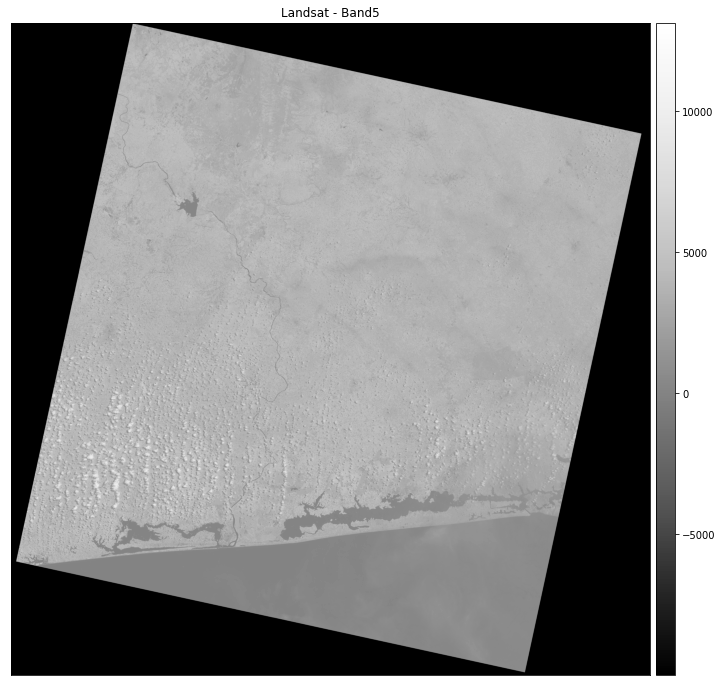

In [17]:
import earthpy.plot as ep

ep.plot_bands(band5, title="Landsat - Band5")

### Create raster stack

<img src="images/RGBSTack_1.jpg"  width =500 />

Source:https://erinbecker.github.io/r-raster-vector-geospatial/05-raster-multi-band-in-r/index.html

But often we don't want to read only one band, but all bands as a stack.

In [18]:
import glob

landsat_paths= glob.glob("Data/raster/satellite/*band*.tif")
landsat_paths.sort()
landsat_paths

['Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band1.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band2.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band3.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band4.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band5.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band6.tif',
 'Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_sr_band7.tif']

In [38]:
import earthpy.spatial as es

path_landsat_stack = 'Data/raster/satellite/stacked.tif'
stack = es.stack(landsat_paths, path_landsat_stack, nodata= -999)
stack

(masked_array(
   data=[[[-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          ...,
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999]],
 
         [[-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          ...,
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999]],
 
         [[-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          [-9999, -9999, -9999, ..., -9999, -9999, -9999],
          ...,
          [-9999, -9999, -9999, ..., -9999, -9999

In [35]:
with rasterio.open(path_landsat_stack) as src:
    meta = src.meta
    profile = raster.profile
    transform = src.transform
    landsat_stack = src.read()
    mask =src.dataset_mask()
    crs = src.crs

In [21]:
landsat_stack[5]

array([[-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       ...,
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999]], dtype=int16)

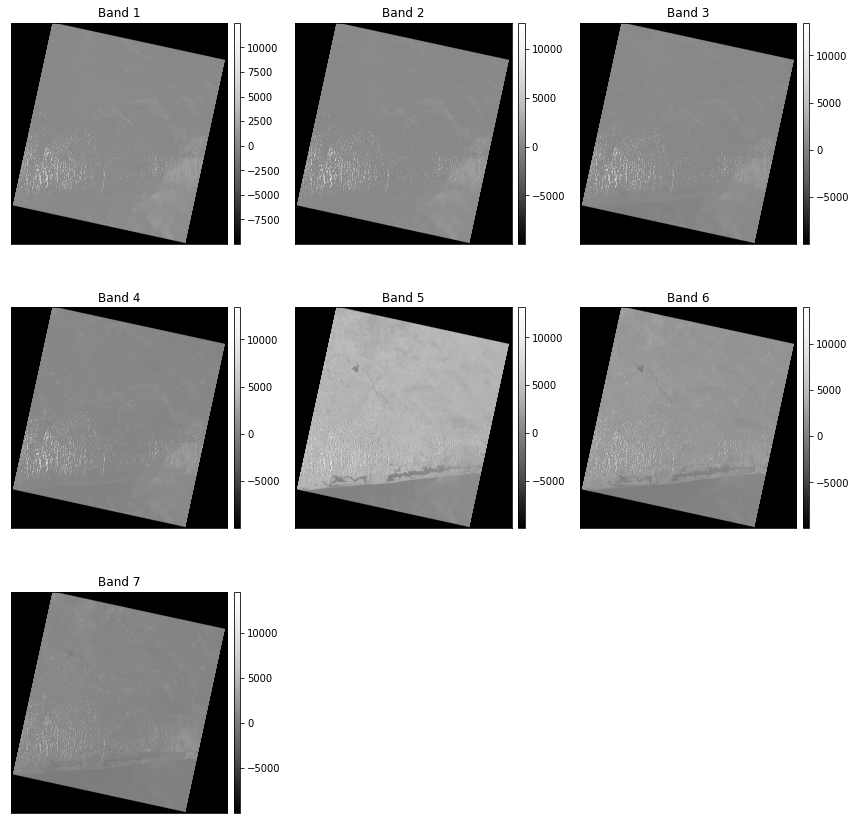

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb180ede970>,
      dtype=object)

In [22]:
# Plot all bands using earthpy
band_titles = [ "Band 1", "Band 2", "Band 3", "Band 4",
               "Band 5", "Band 6", 'Band 7']
ep.plot_bands(landsat_stack,
              title=band_titles,
              cmap="Greys_r")

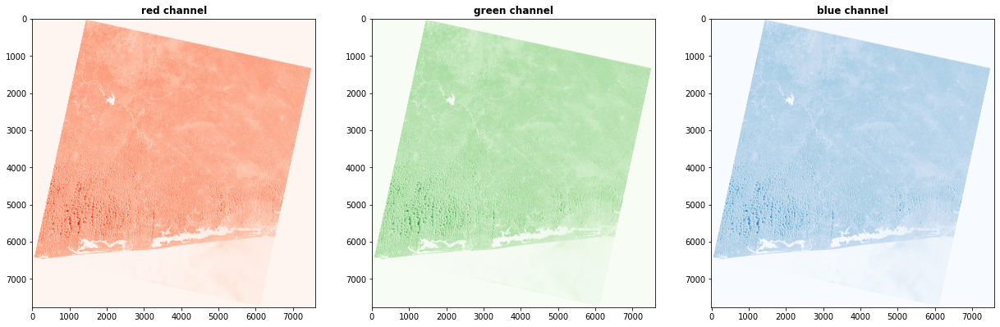

In [40]:
import matplotlib.pyplot as plt
from rasterio.plot import show

r = np.where(landsat_stack[4]==-9999, 0, landsat_stack[4])
g = np.where(landsat_stack[3]==-9999, 0, landsat_stack[4]) 
b = np.where(landsat_stack[2]==-9999, 0, landsat_stack[4]) 

fig, (axr, axg, axb) = plt.subplots(1,3, figsize=(21,7))
show(r, ax=axr, cmap='Reds', title='red channel')
show(g, ax=axg, cmap='Greens', title='green channel')
show(b, ax=axb, cmap='Blues', title='blue channel')

plt.show()

### Explore the Range of Values in the Data

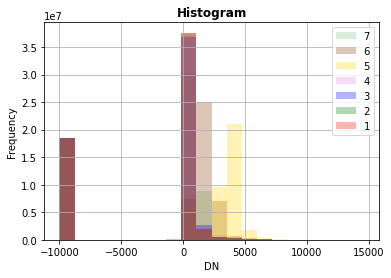

In [24]:
from rasterio.plot import show_hist
show_hist(landsat_stack, bins=20, lw=0.0, stacked=False, alpha=0.3,histtype='stepfilled', title="Histogram")

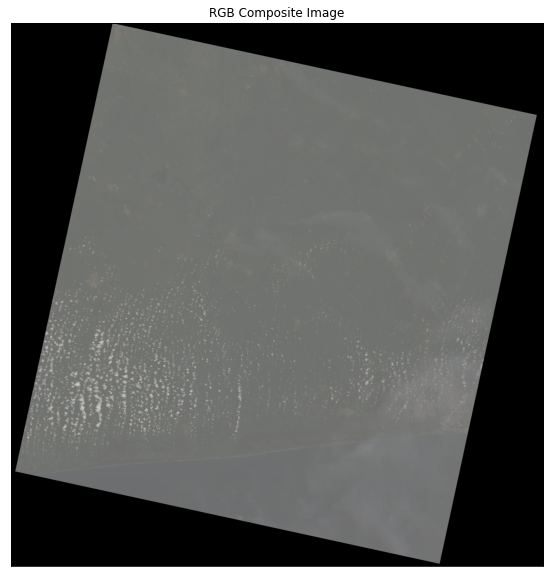

In [37]:
ep.plot_rgb(landsat_stack,
            rgb=[3, 2, 1],
            title="RGB Composite Image")

### Image stretching
<img src="images/imageStretch_dark.jpg" width="600" />


Notice that the image above looks dark. Below you use the stretch argument built into the earthpy plot_rgb() function. The str_clip argument allows you to specify how much of the tails of the data that you want to clip off

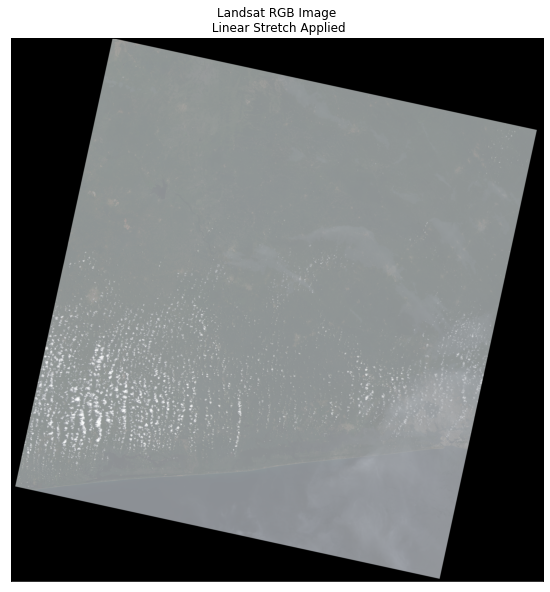

In [34]:
ep.plot_rgb(landsat_stack,
            rgb=[3, 2, 1],
            title="Landsat RGB Image\n Linear Stretch Applied",
            stretch=True,
            str_clip=0.01)

### Masking

In [65]:
from rasterio.mask import mask
import geopandas as gpd

ext = gpd.read_file('Data/raster/satellite/AoI.shp')
ext = ext.to_crs(crs)

In [66]:
import json

def extract_features(geodataframe):
    return [json.loads(geodataframe.to_json())['features'][0]['geometry']]


coords = extract_features(ext)
print(coords)

[{'type': 'Polygon', 'coordinates': [[[250078.5779954054, 655699.9887014097], [250299.49484841307, 707897.9554041026], [306860.37826595304, 707677.604842164], [306689.5735563885, 655495.6437944707], [250078.5779954054, 655699.9887014097]]]}]


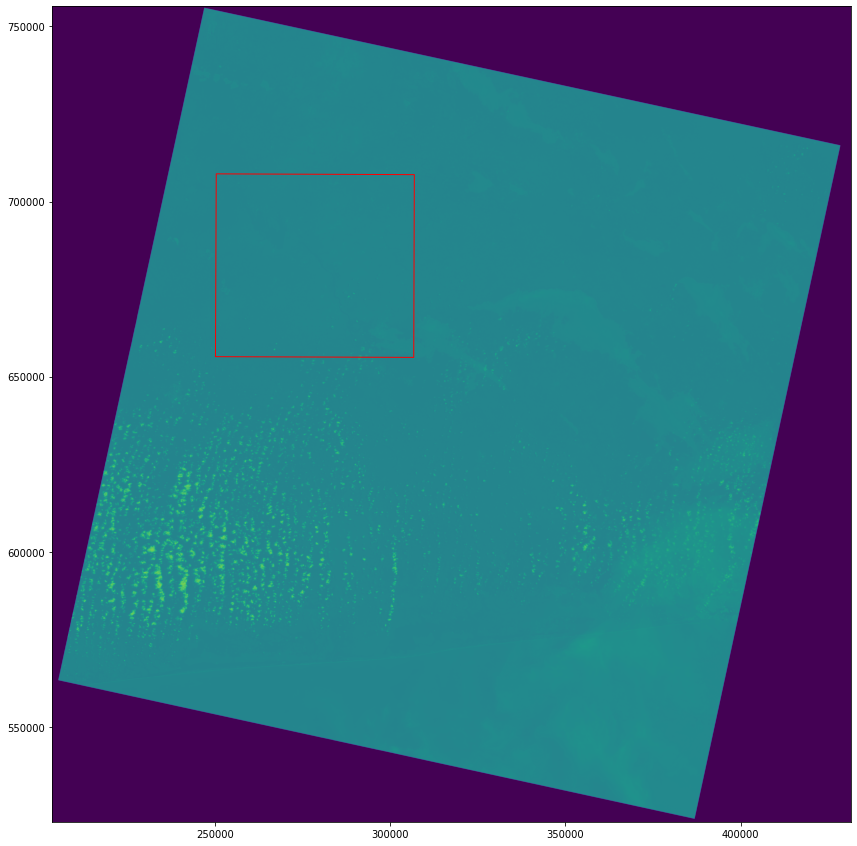

In [67]:
import matplotlib.pyplot as plt
from rasterio.plot import show

fig, ax = plt.subplots(figsize=(15, 15))
show(landsat_stack[0],transform=transform, ax=ax)
ext.plot(ax=ax, facecolor='none', edgecolor='r');
plt.show()

In [68]:
from rasterio.mask import mask

landsat_stack = rasterio.open(path_landsat_stack)
out_img, out_transform = mask(dataset=landsat_stack, shapes=coords, crop=True)

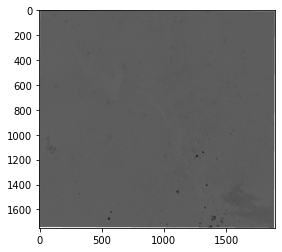

In [72]:
from rasterio.plot import show
show(out_img[1], cmap='Greys')

In [77]:
out_meta = landsat_stack.meta.copy()
print(out_meta)

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -9999.0, 'width': 7601, 'height': 7761, 'count': 7, 'crs': CRS.from_epsg(32630), 'transform': Affine(30.0, 0.0, 203385.0,
       0.0, -30.0, 755715.0)}


In [78]:
out_meta.update({"driver": "GTiff",
                 "height": out_img.shape[1],
                 "width": out_img.shape[2],
                 "transform": out_transform,
                 "crs": raster.crs}
                         )
with rasterio.open('Data/raster/satellite/landsat_clip', "w", **out_meta) as dest:
        dest.write(out_img)

## Band Combinations

In [3]:
with rasterio.open('Data/raster/satellite/landsat_clip') as src:
    meta = src.meta
    profile = raster.profile
    transform = src.transform
    landsat_stack = src.read()
    crs = src.crs

The natural color composite uses a band combination of red , green  and blue . It replicates close to what our human eye see. While healthy vegetation is green, unhealthy flora is brown. Urban features appear white and grey and water is dark blue or black. 

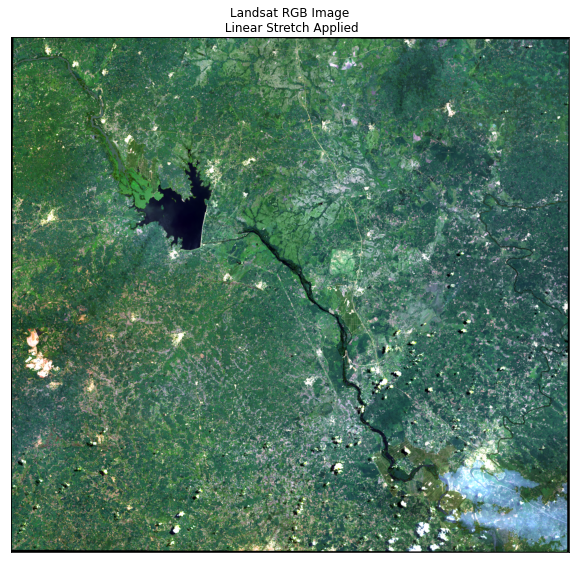

In [82]:
ep.plot_rgb(landsat_stack,
            rgb=[3, 2, 1],
            title="Landsat RGB Image\n Linear Stretch Applied",
            stretch=True,
            str_clip=0.95)

This band combination is also called the near infrared (NIR) composite. It uses near-infrared, red and green. Because chlorophyll reflects near infrared light, this band composition is useful for analyzing vegetation. In particular, areas in red have better vegetation health. Dark areas are water and urban areas are white.

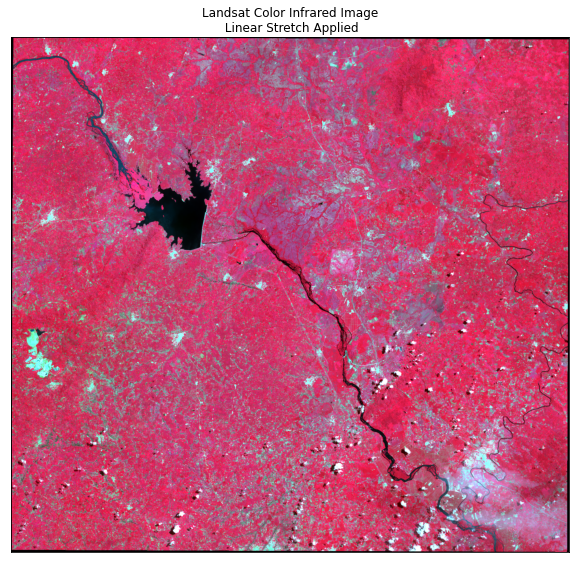

In [84]:
ep.plot_rgb(landsat_stack,
            rgb=[4, 3, 2],
            title="Landsat Color Infrared Image\n Linear Stretch Applied",
            stretch=True,
            str_clip=0.95)

The short-wave infrared band combination uses SWIR-2, SWIR-1 and red. This composite displays vegetation in shades of green. While darker shades of green indicate denser vegetation, sparse vegetation have lighter shades. Urban areas are blue and soils have various shades of brown.

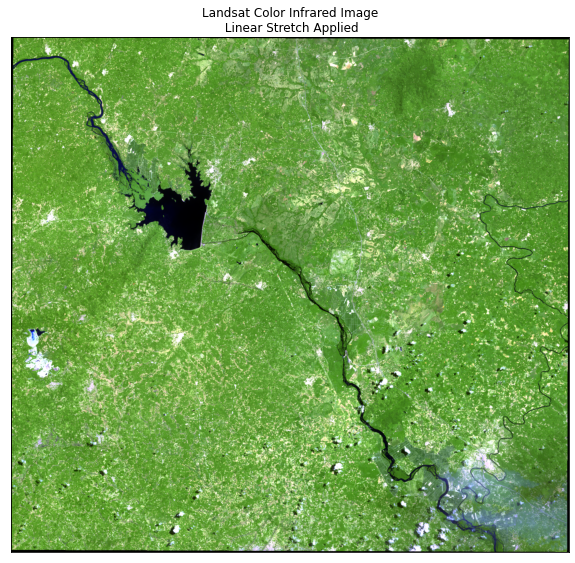

In [85]:
ep.plot_rgb(landsat_stack,
            rgb=[6, 5, 3],
            title="Landsat Color Infrared Image\n Linear Stretch Applied",
            stretch=True,
            str_clip=0.95)

This band combination uses SWIR-1, near-infrared and blue. It’s commonly used for crop monitoring because of the use of short-wave and near infrared. Healthy vegetation appears dark green. But bare earth has a magenta hue. 

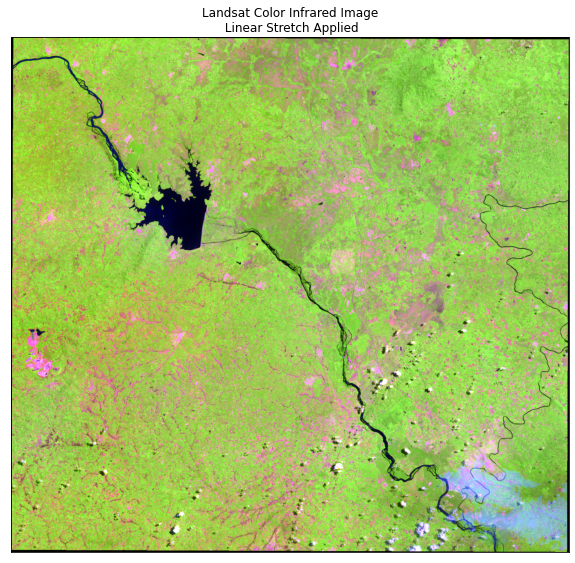

In [86]:
ep.plot_rgb(landsat_stack,
            rgb=[5, 4, 1],
            title="Landsat Color Infrared Image\n Linear Stretch Applied",
            stretch=True,
            str_clip=0.95)

## Indices

Spectral indices are combinations of spectral reflectance from two or more wavelengths that indicate the relative abundance of features of interest. Vegetation indices are the most popular type, but other indices are available for burned areas, man-made (built-up) features, water, and geologic features

<img src="images/ndvi_example.jpg" width="300" />
Source:https://earthobservatory.nasa.gov/features/MeasuringVegetation/measuring_vegetation_2.php

In [13]:
import numpy as np

def NDVI(R,NIR):
    ndvi = (NIR.astype(float) - R.astype(float)) / (NIR.astype(float) + NIR.astype(float))
    return ndvi

def SAVI(R,NIR,L=0.5):
    savi = ((NIR.astype(float)-R.astype(float)) / (NIR.astype(float) + R + L.astype(float))) * (1+L.astype(float))
    return savi

def NDWI(G, NIR):
    ndwi = (G.astype(float) - NIR.astype(float)) / (G + NIR)
    return ndwi
    
def NBR(NIR,SWIR):
    nbr = (NIR - SWIR) / (NIR+SWIR)
    nbr = nbr.astype(np.float32)
    return nbr


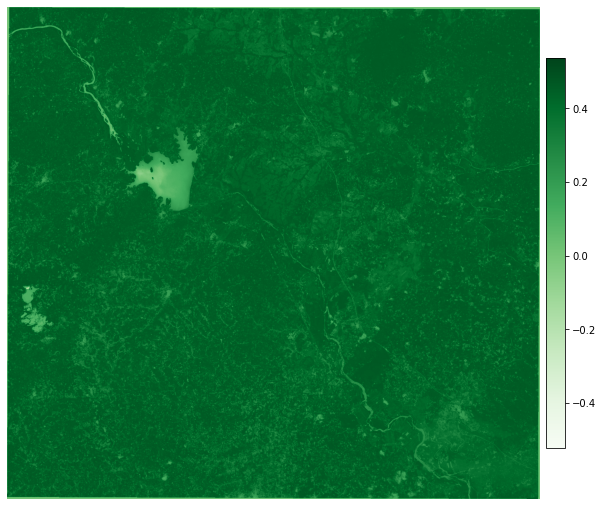

In [107]:
import matplotlib.pyplot as plt

ndvi = NDVI(landsat_stack[3],landsat_stack[4])


fig, ax = plt.subplots(figsize=(10,10))
dsmplot = ax.imshow(ndvi, cmap='Greens')
cbar = fig.colorbar(dsmplot, fraction=0.035, pad=0.01)
cbar.ax.get_yaxis().labelpad = 15
ax.set_axis_off()
plt.show()

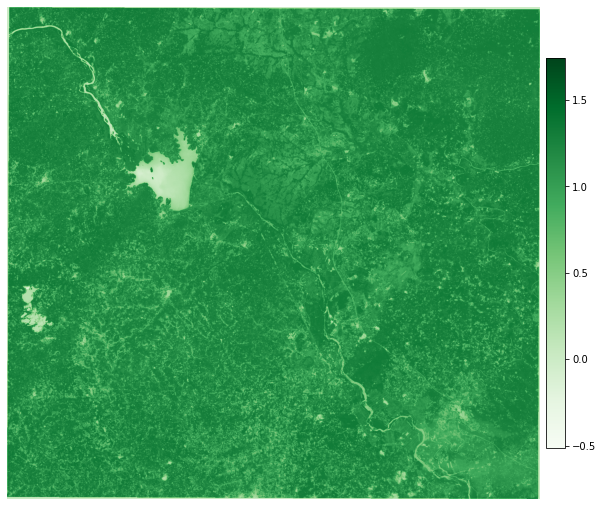

In [108]:
savi = SAVI(landsat_stack[3],landsat_stack[4])


fig, ax = plt.subplots(figsize=(10,10))
dsmplot = ax.imshow(savi, cmap='Greens')
cbar = fig.colorbar(dsmplot, fraction=0.035, pad=0.01)
cbar.ax.get_yaxis().labelpad = 15
ax.set_axis_off()
plt.show()

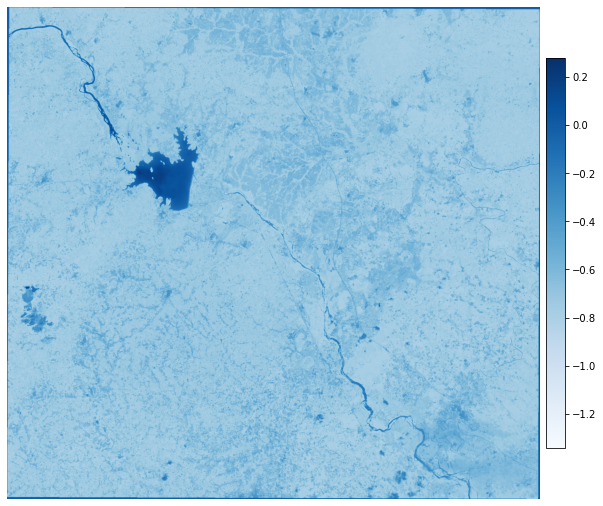

In [20]:
ndwi = NDWI(landsat_stack[2],landsat_stack[4])


fig, ax = plt.subplots(figsize=(10,10))
dsmplot = ax.imshow(ndwi, cmap='Blues')
cbar = fig.colorbar(dsmplot, fraction=0.035, pad=0.01)
cbar.ax.get_yaxis().labelpad = 15
ax.set_axis_off()
plt.show()

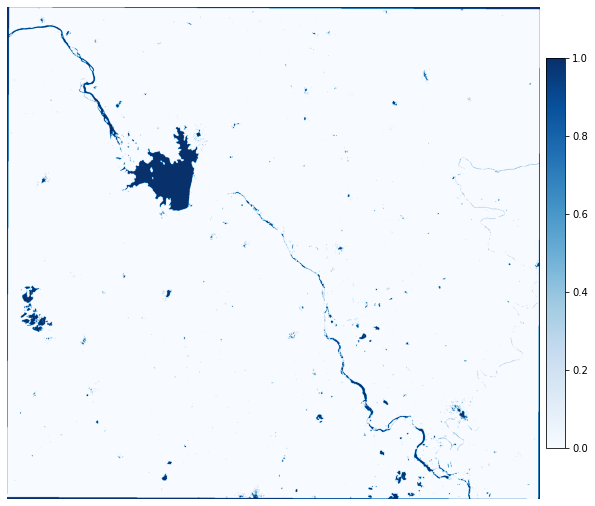

In [26]:
water = np.where(ndwi > -0.4, 1, 0)

fig, ax = plt.subplots(figsize=(10,10))
dsmplot = ax.imshow(water, cmap='Blues')
cbar = fig.colorbar(dsmplot, fraction=0.035, pad=0.01)
cbar.ax.get_yaxis().labelpad = 15
ax.set_axis_off()
plt.show()

### Cloud, Mask, Cloud Shadows

In [119]:
qa = rasterio.open("Data/raster/satellite/LC08_L1TP_196056_20200428_20200509_01_T1_pixel_qa.tif")

In [120]:
from rasterio.mask import mask

out_img, out_transform = mask(dataset=qa, shapes=coords, crop=True)

In [121]:
out_meta = qa.meta.copy()
print(out_meta)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 1.0, 'width': 7601, 'height': 7761, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(30.0, 0.0, 203385.0,
       0.0, -30.0, 755715.0)}


In [124]:
out_meta.update({"driver": "GTiff",
                 "height": out_img.shape[1],
                 "width": out_img.shape[2],
                 "transform": out_transform,
                 "crs": raster.crs}
                         )
with rasterio.open('Data/raster/satellite/qa_clip.tif', "w", **out_meta) as dest:
        dest.write(out_img)

Many remote sensing data sets come with quality layers that you can use as a mask to remove “bad” pixels from your analysis. In the case of landsat, the mask layers identify pixels that are likely representative of cloud cover, shadow and even water. When you download Landsat 8 data from Earth Explorer, the data came with a processed cloud shadow / mask raster layer called landsat_file_name_pixel_qa.tif. 

In [4]:
with rasterio.open("Data/raster/satellite/qa_clip.tif") as src:
    landsat_qa = src.read(1)
    
with rasterio.open("Data/raster/satellite/landsat_clip") as src:
    landsat_stack = src.read()

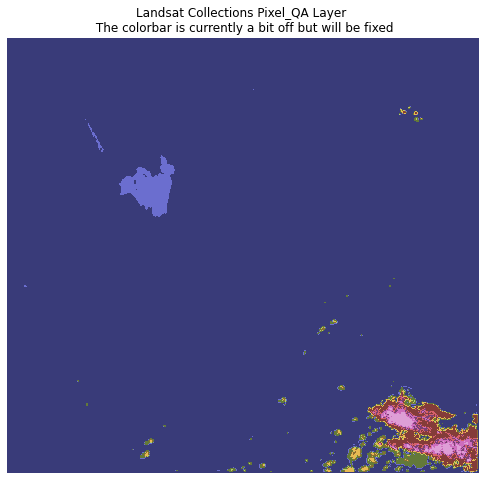

In [6]:
from matplotlib import patches as mpatches, colors
import matplotlib.pyplot as plt
import numpy as np

cmap = plt.cm.get_cmap('tab20b', 11)
vals = np.unique(landsat_qa).tolist()
bins = [0] + vals
bounds = [((a + b) / 2) for a, b in zip(bins[:-1], bins[1::1])] + [(bins[-1] - bins[-2]) + bins[-1]]
norm = colors.BoundaryNorm(bounds, cmap.N)

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(landsat_qa,
               cmap=cmap,
              norm=norm)

ax.set_title("Landsat Collections Pixel_QA Layer \n The colorbar is currently a bit off but will be fixed")
ax.set_axis_off()
plt.show()

<img src="images/pixel_qa.png"  />

In [7]:

cl_mask = np.zeros(landsat_qa.shape)

# Generate array of all possible cloud / shadow values
cloud_shadow = [328, 392, 840, 904, 1350]
cloud = [352, 368, 416, 432, 480, 864, 880, 928, 944, 992]
high_confidence_cloud = [480, 992]

all_masked_values = cloud_shadow + cloud + high_confidence_cloud
all_masked_values

[328,
 392,
 840,
 904,
 1350,
 352,
 368,
 416,
 432,
 480,
 864,
 880,
 928,
 944,
 992,
 480,
 992]

In [8]:
# is there a way to do this without a loop?
# populate new array with values of 1 for every pixel that is a cloud or cloud shadow

for cval in all_masked_values:
    # create cloud mask for all relevant cloud values, for the primary scene
    cl_mask[landsat_qa == cval] = 1
    # print(cval)
np.unique(cl_mask)
cl_mask

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

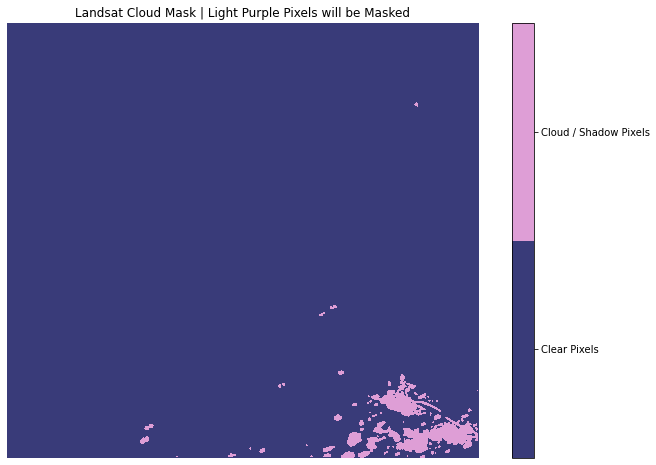

In [9]:
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(cl_mask,
               cmap=plt.cm.get_cmap('tab20b', 2))
cbar = fig.colorbar(im)
cbar.set_ticks((0.25, .75))
cbar.ax.set_yticklabels(["Clear Pixels", "Cloud / Shadow Pixels"])
ax.set_title("Landsat Cloud Mask | Light Purple Pixels will be Masked")
ax.set_axis_off()

plt.show()

In [10]:
# Create a mask for all bands in the landsat scene
import numpy.ma as ma

landsat_pre_mask = np.broadcast_to(cl_mask == 1, landsat_stack.shape)
landsat_pre_cl_free = ma.masked_array(landsat_stack,
                                      mask=landsat_pre_mask)


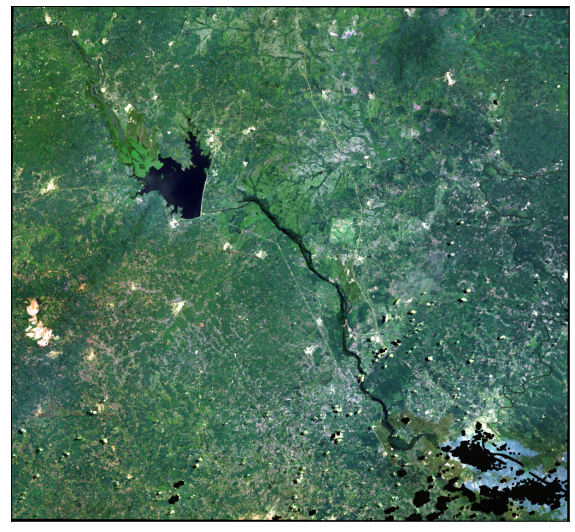

In [11]:
# Plot
import earthpy.plot as ep
ep.plot_rgb(landsat_pre_cl_free,
            rgb=[3, 2, 1],
           stretch=True,
            str_clip=0.95)

## Classification

### Unsupervised Classification

In [55]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import numpy as np
from shapely.geometry import mapping
import matplotlib.pyplot as plt
import os


In [57]:
import glob
landsat_paths= glob.glob("Data/raster/classification/LT52240632011210/*sr*band*.tif")
landsat_paths.sort()
landsat_paths

['Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band1.tif',
 'Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band2.tif',
 'Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band3.tif',
 'Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band4.tif',
 'Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band5.tif',
 'Data/raster/classification/LT52240632011210/LT52240632011210CUB01_sr_band7.tif']

In [58]:
import earthpy.spatial as es
path_landsat_stack = 'Data/raster/classification/stacked.tif'
stack = es.stack(landsat_paths, path_landsat_stack)
stack

(array([[[ 181,  220,  220, ...,  128,  108,  108],
         [ 241,  220,  220, ...,  108,  128,  108],
         [ 201,  201,  201, ...,  108,  147,  168],
         ...,
         [ 144,  163,  144, ...,  148,  129,  109],
         [ 163,  163,  184, ...,  169,  169,  148],
         [ 144,  144,  163, ...,  148,  169,  148]],
 
        [[ 400,  400,  439, ...,  158,  198,  158],
         [ 400,  361,  361, ...,  158,  198,  237],
         [ 400,  400,  361, ...,  198,  198,  198],
         ...,
         [ 244,  283,  283, ...,  276,  276,  237],
         [ 244,  283,  362, ...,  276,  276,  276],
         [ 283,  283,  283, ...,  276,  276,  276]],
 
        [[ 267,  267,  267, ...,  106,  137,  106],
         [ 267,  267,  235, ...,  106,  106,  106],
         [ 267,  267,  267, ...,  137,  137,  137],
         ...,
         [ 173,  173,  173, ...,  169,  201,  200],
         [ 173,  173,  236, ...,  169,  169,  169],
         [ 204,  173,  173, ...,  169,  169,  169]],
 
        [[334

In [59]:
rpath = 'Data/raster/classification/stacked.tif'

In [60]:
with rasterio.open(rpath) as src:
    landsat_stack = img = src.read()
    bands = src.count
    crs = src.crs
    
bands, rows, cols = landsat_stack.shape
landsat_stack.shape

(6, 1499, 2967)

In [61]:
from rasterio.plot import reshape_as_raster, reshape_as_image

# reshape into long 2d array (nrow * ncol, nband)

reshaped_img = reshape_as_image(landsat_stack)
print(landsat_stack.shape)
reshaped_img.shape

reshaped_img.reshape(-1, bands).shape

(6, 1499, 2967)


(4447533, 6)

In [62]:
# First setup a 5-4-3 composite
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors

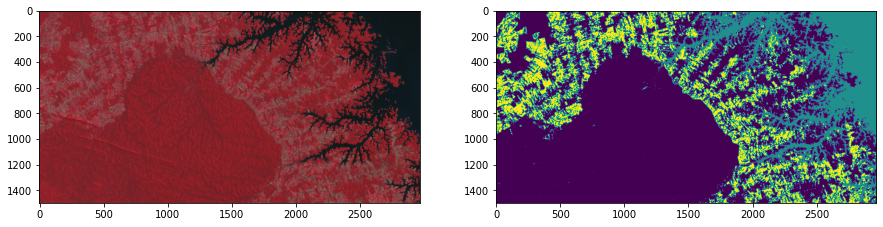

In [63]:
from sklearn.cluster import KMeans


k = 3 # num of clusters

kmeans_predictions = KMeans(n_clusters=k, random_state=0).fit(reshaped_img.reshape(-1, bands))

kmeans_predictions_2d = kmeans_predictions.labels_.reshape(rows, cols)

# Now show the classmap next to the image
fig, axs = plt.subplots(1,2,figsize=(15,8))

img_stretched = color_stretch(reshaped_img, [3, 2, 1])
axs[0].imshow(img_stretched)

axs[1].imshow(kmeans_predictions_2d)

In [64]:
## Supervised Classfication

In [65]:
full_dataset = rasterio.open(rpath)
img_rows, img_cols = full_dataset.shape
img_bands = full_dataset.count
dtype=full_dataset.meta
print(img_rows)
print(img_cols)
print(img_bands)
print(dtype)

1499
2967
6
{'driver': 'GTiff', 'dtype': 'int16', 'nodata': -32768.0, 'width': 2967, 'height': 1499, 'count': 6, 'crs': CRS.from_epsg(32622), 'transform': Affine(30.0, 0.0, 579765.0,
       0.0, -30.0, -477735.0)}


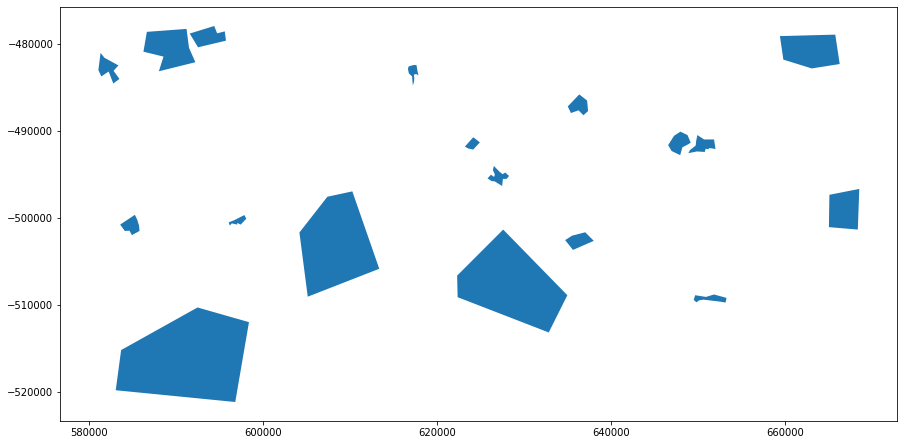

In [66]:
shapefile = gpd.read_file('Data/vector/training_2011.shp')
shapefile.geometry.plot(figsize=(15,15))

In [67]:
# this generates a list of shapely geometries
geoms = shapefile.geometry.values 

# let's grab a single shapely geometry to check
geometry = geoms[0] 
#print(type(geometry))
#print(geometry)

# transform to GeoJSON format
from shapely.geometry import mapping
feature = [mapping(geometry)] # can also do this using polygon.__geo_interface__
#print(type(feature))
print(feature)

[{'type': 'Polygon', 'coordinates': (((647245.578319154, -490601.2475572685), (647977.0572475104, -490122.9728733431), (648792.9375906772, -490516.8461424581), (649158.6770548554, -491388.99409549846), (648849.2052005507, -491585.93073005596), (648202.1276870046, -491923.53638929734), (647948.9234425736, -492823.8181472745), (646964.2402697861, -492345.5434633491), (646570.3670006711, -491670.3321448663), (647245.578319154, -490601.2475572685)),)}]


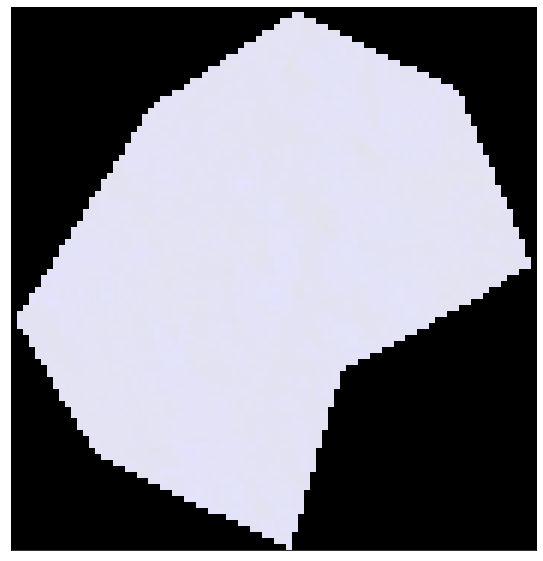

In [68]:
import earthpy.plot as ep

out_image, out_transform = mask(full_dataset, feature, crop=True)
ep.plot_rgb(out_image,
            rgb=[1, 2, 3])

In [69]:
X = np.array([], dtype=np.uint16).reshape(0,img_bands) # pixels for training
y = np.array([], dtype=np.int8) # labels for training

# extract the raster values within the polygon 
with rasterio.open(rpath) as src:
    band_count = src.count
    for index, geom in enumerate(geoms):
        feature = [mapping(geom)]

        # the mask function returns an array of the raster pixels within this feature
        out_image, out_transform = mask(src, feature, crop=True) 
        # eliminate all the pixels with 0 values for all 8 bands - AKA not actually part of the shapefile
        out_image_trimmed = out_image[:,~np.all(out_image == -32768, axis=0)]
        # reshape the array to [pixel count, bands]
        out_image_reshaped = np.transpose(out_image_trimmed) 
        # append the labels to the y array
        y = np.append(y,[shapefile["id"][index]] * out_image_reshaped.shape[0]) 
        # stack the pizels onto the pixel array
        X = np.vstack((X,out_image_reshaped))      
        
X
y

array([1, 1, 1, ..., 1, 1, 1])

In [70]:
# What are our classification labels?
labels = np.unique(shapefile["id"])
print('The training data include {n} classes: {classes}\n'.format(n=labels.size, 
                                                                classes=labels))

# We will need a "X" matrix containing our features, and a "y" array containing our labels
print('Our X matrix is sized: {sz}'.format(sz=X.shape))
print('Our y array is sized: {sz}'.format(sz=y.shape))

The training data include 3 classes: [1 2 3]

Our X matrix is sized: (401417, 6)
Our y array is sized: (401417,)


Text(0.5, 1.0, 'Band Intensities Higher Ref Subset')

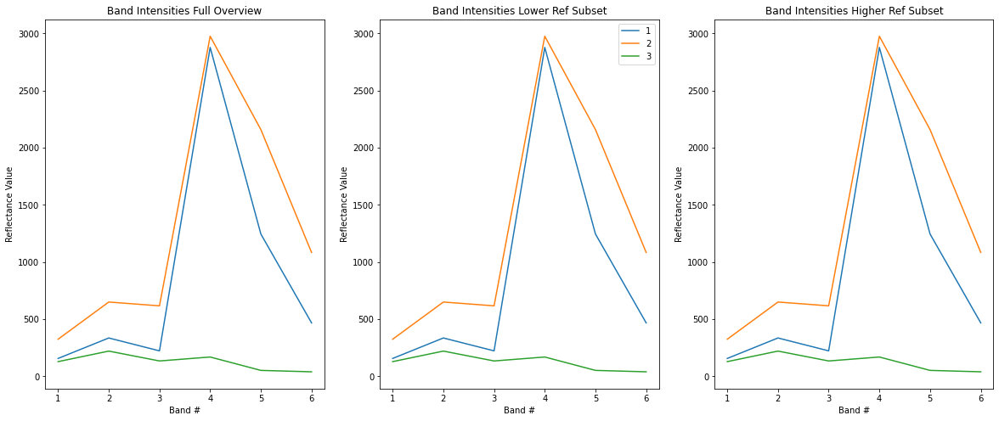

In [71]:
fig, ax = plt.subplots(1,3, figsize=[20,8])

# numbers 1-8
band_count = np.arange(1,7)

classes = np.unique(y)
for class_type in classes:
    band_intensity = np.mean(X[y==class_type, :], axis=0)
    ax[0].plot(band_count, band_intensity, label=class_type)
    ax[1].plot(band_count, band_intensity, label=class_type)
    ax[2].plot(band_count, band_intensity, label=class_type)
# plot them as lines

# Add some axis labels
ax[0].set_xlabel('Band #')
ax[0].set_ylabel('Reflectance Value')
ax[1].set_ylabel('Reflectance Value')
ax[1].set_xlabel('Band #')
ax[2].set_ylabel('Reflectance Value')
ax[2].set_xlabel('Band #')

#ax.set
ax[1].legend(loc="upper right")
# Add a title
ax[0].set_title('Band Intensities Full Overview')
ax[1].set_title('Band Intensities Lower Ref Subset')
ax[2].set_title('Band Intensities Higher Ref Subset')

In [72]:
from sklearn.ensemble import RandomForestClassifier

# Initialize our model with 200 trees
rf = RandomForestClassifier(n_estimators=200, oob_score=True,  n_jobs=-1)

# Fit our model to training data
rf = rf.fit(X, y)
rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=True, random_state=None, verbose=0,
                       warm_start=False)

In [45]:
print('Our OOB prediction of accuracy is: {oob}%'.format(oob=rf.oob_score_ * 100))

Our OOB prediction of accuracy is: 99.72995662864304%


In [46]:

bands = [1, 2, 3, 4, 5, 6]

for b, imp in zip(bands, rf.feature_importances_):
    print('Band {b} importance: {imp}'.format(b=b, imp=imp))

Band 1 importance: 0.04382504086129973
Band 2 importance: 0.1414730220994682
Band 3 importance: 0.2270551477062425
Band 4 importance: 0.16629274211688255
Band 5 importance: 0.23480237259524359
Band 6 importance: 0.18655167462086344


In [47]:
import pandas as pd

# Setup a dataframe -- just like R
df = pd.DataFrame()
df['truth'] = y
df['predict'] = rf.predict(X)

# Cross-tabulate predictions
print(pd.crosstab(df['truth'], df['predict'], margins=True))

predict       1      2      3     All
truth                                
1        330693      2      0  330695
2            72  28368      0   28440
3             0      0  42282   42282
All      330765  28370  42282  401417


In [48]:
from rasterio.plot import show
from rasterio.plot import show_hist
from rasterio.windows import Window
from rasterio.plot import reshape_as_raster, reshape_as_image

In [49]:
with rasterio.open(rpath) as src:
    # may need to reduce this image size if your kernel crashes, takes a lot of memory
    img = src.read()

# Take our full image and reshape into long 2d array (nrow * ncol, nband) for classification
print(img.shape)
reshaped_img = reshape_as_image(img)
print(reshaped_img.shape)
reshaped_img.reshape(-1, 6)

(6, 1499, 2967)
(1499, 2967, 6)


array([[ 181,  400,  267, 3342, 1474,  545],
       [ 220,  400,  267, 3184, 1368,  504],
       [ 220,  439,  267, 3460, 1501,  545],
       ...,
       [ 148,  276,  169,  285,  150,  106],
       [ 169,  276,  169,  285,  150,  106],
       [ 148,  276,  169,  285,   96,   66]], dtype=int16)

In [50]:
class_prediction = rf.predict(reshaped_img.reshape(-1, 6))

# Reshape our classification map back into a 2D matrix so we can visualize it
class_prediction = class_prediction.reshape(reshaped_img[:, :, 0].shape)

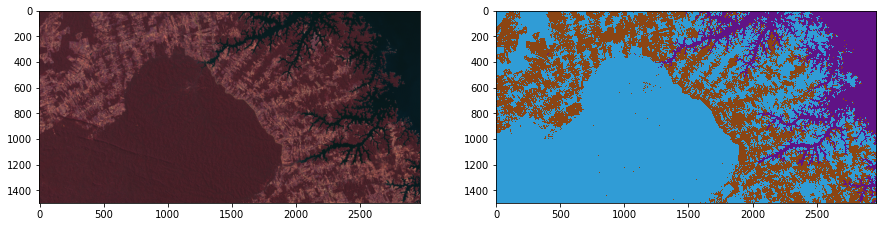

In [51]:
# First setup a 5-4-3 composite
def color_stretch(image, index):
    colors = image[:, :, index].astype(np.float64)
    for b in range(colors.shape[2]):
        colors[:, :, b] = rasterio.plot.adjust_band(colors[:, :, b])
    return colors
    
# find the highest pixel value in the prediction image
n = int(np.max(class_prediction))

# next setup a colormap for our map
colors = dict((
    (1, (48, 156, 214, 255)),   
    (2, (139,69,19, 255)),      
    (3, (96, 19, 134, 255)),    
))

# Put 0 - 255 as float 0 - 1
for k in colors:
    v = colors[k]
    _v = [_v / 255.0 for _v in v]
    colors[k] = _v
    
index_colors = [colors[key] if key in colors else 
                (255, 255, 255, 0) for key in range(1, n + 1)]

cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', n)

# Now show the class map next to the RGB image

fig, axs = plt.subplots(1,2,figsize=(15,15))

img_stretched = color_stretch(reshaped_img, [4, 2, 1])
axs[0].imshow(img_stretched)

axs[1].imshow(class_prediction, cmap=cmap, interpolation='none')

plt.show()

## Take advantage of the Cloud

In [52]:
import pandas as pd
import geopandas as gpd
import folium
import os, shutil
from glob import glob
import numpy as np

In [53]:
bounds = gpd.read_file('Data/vector/landuse.shp')

In [54]:
import wget

url = 'https://landsat.usgs.gov/sites/default/files/documents/WRS2_descending.zip'
filename = wget.download(url)


In [83]:
shutil.unpack_archive('WRS2_descending.zip','wrs2')

In [84]:
wrs = gpd.GeoDataFrame.from_file('wrs2/WRS2_descending.shp')

wrs.head()

,AREA,PERIMETER,PR_,PR_ID,RINGS_OK,RINGS_NOK,PATH,ROW,MODE,SEQUENCE,WRSPR,PR,ACQDayL7,ACQDayL8,geometry
0,15.74326,26.98611,1.0,1.0,1,0,13,1,D,2233,013001,013001,1,9,"POLYGON ((-10.80341 80.98880, -8.97407 80.3420..."
1,14.55366,25.84254,2.0,2.0,1,0,13,2,D,2234,013002,013002,1,9,"POLYGON ((-29.24250 80.18681, -29.29593 80.198..."
2,13.37247,24.20303,3.0,3.0,1,0,13,3,D,2235,013003,013003,1,9,"POLYGON ((-24.04206 79.12261, -23.78294 79.063..."
3,12.26691,22.40265,4.0,4.0,1,0,13,4,D,2236,013004,013004,1,9,"POLYGON ((-36.66813 77.46094, -40.05219 78.098..."
4,11.26511,20.64284,5.0,5.0,1,0,13,5,D,2237,013005,013005,1,9,"POLYGON ((-44.11210 76.93656, -44.12470 76.938..."


In [86]:
wrs_intersection = wrs[wrs.intersects(bounds.geometry[0])]
wrs_intersection

,AREA,PERIMETER,PR_,PR_ID,RINGS_OK,RINGS_NOK,PATH,ROW,MODE,SEQUENCE,WRSPR,PR,ACQDayL7,ACQDayL8,geometry
8701,4.38466,8.897,2998.0,2998.0,1,0,194,22,D,15894,194022,194022,5,13,"POLYGON ((10.85281 53.96617, 10.85190 53.96630..."
24945,4.38466,8.897,2998.0,2998.0,1,0,193,22,D,48382,193022,193022,14,6,"POLYGON ((12.39783 53.96618, 12.39700 53.96630..."


In [88]:
paths, rows = wrs_intersection['PATH'].values, wrs_intersection['ROW'].values
paths

array([194, 193])

In [90]:
# Get the center of the map
xy = np.asarray(bounds.centroid[0].xy).squeeze()
center = list(xy[::-1])

# Select a zoom
zoom = 6

# Create the most basic OSM folium map
m = folium.Map(location=center, zoom_start=zoom, control_scale=True)

# Add the bounds GeoDataFrame in red
m.add_child(folium.GeoJson(bounds.__geo_interface__, name='Area of Study', 
                           style_function=lambda x: {'color': 'red', 'alpha': 0}))

# Iterate through each Polygon of paths and rows intersecting the area
for i, row in wrs_intersection.iterrows():
    # Create a string for the name containing the path and row of this Polygon
    name = 'path: %03d, row: %03d' % (row.PATH, row.ROW)
    # Create the folium geometry of this Polygon 
    g = folium.GeoJson(row.geometry.__geo_interface__, name=name)
    # Add a folium Popup object with the name string
    g.add_child(folium.Popup(name))
    # Add the object to the map
    g.add_to(m)

folium.LayerControl().add_to(m)
m.save('wrs.html')
m

In [ ]:
paths, rows = wrs_intersection['PATH'].values, wrs_intersection['ROW'].values
paths

In [92]:
b = (paths == 194)
paths = paths[b]
rows = rows[b]

rows

array([22])

In [93]:
for i, (path, row) in enumerate(zip(paths, rows)):
    print('Image', i+1, ' - path:', path, 'row:', row)

Image 1  - path: 194 row: 22


In [95]:
s3_scenes = pd.read_csv('http://landsat-pds.s3.amazonaws.com/c1/L8/scene_list.gz', compression='gzip')
s3_scenes

,productId,entityId,acquisitionDate,cloudCover,processingLevel,path,row,min_lat,min_lon,max_lat,max_lon,download_url
0,LC08_L1TP_149039_20170411_20170415_01_T1,LC81490392017101LGN00,2017-04-11 05:36:29.349932,0.00,L1TP,149,39,29.22165,72.41205,31.34742,74.84666,https://s3-us-west-2.amazonaws.com/landsat-pds...
1,LC08_L1TP_012001_20170411_20170415_01_T1,LC80120012017101LGN00,2017-04-11 15:14:40.001201,0.15,L1TP,12,1,79.51504,-22.06995,81.90314,-7.44339,https://s3-us-west-2.amazonaws.com/landsat-pds...
2,LC08_L1TP_012002_20170411_20170415_01_T1,LC80120022017101LGN00,2017-04-11 15:15:03.871058,0.38,L1TP,12,2,78.74882,-29.24387,81.14549,-15.04330,https://s3-us-west-2.amazonaws.com/landsat-pds...
3,LC08_L1TP_012010_20170411_20170415_01_T1,LC80120102017101LGN00,2017-04-11 15:18:14.918879,0.02,L1TP,12,10,69.67856,-56.04655,72.02949,-48.71678,https://s3-us-west-2.amazonaws.com/landsat-pds...
4,LC08_L1TP_012011_20170411_20170415_01_T1,LC80120112017101LGN00,2017-04-11 15:18:38.780265,10.65,L1TP,12,11,68.38187,-57.33186,70.76840,-51.13822,https://s3-us-west-2.amazonaws.com/landsat-pds...
...,...,...,...,...,...,...,...,...,...,...,...,...
2022871,LC08_L1TP_039245_20200705_20200706_01_T1,LC80392452020187LGN00,2020-07-05 19:39:09.165269,0.87,L1TP,39,245,80.55602,-50.25814,82.59423,-35.04094,https://s3-us-west-2.amazonaws.com/landsat-pds...
2022872,LC08_L1TP_039248_20200705_20200706_01_T1,LC80392482020187LGN00,2020-07-05 19:40:20.783319,42.64,L1TP,39,248,80.14553,-79.99001,82.27265,-64.85835,https://s3-us-west-2.amazonaws.com/landsat-pds...
2022873,LC08_L1TP_055001_20200705_20200706_01_T1,LC80550012020187LGN00,2020-07-05 19:40:44.657415,10.52,L1TP,55,1,79.48986,-88.37658,81.85979,-73.75834,https://s3-us-west-2.amazonaws.com/landsat-pds...
2022874,LC08_L1TP_055002_20200705_20200706_01_T1,LC80550022020187LGN00,2020-07-05 19:41:08.531510,7.71,L1TP,55,2,78.71368,-95.54116,81.10622,-81.34607,https://s3-us-west-2.amazonaws.com/landsat-pds...


In [96]:
# Empty list to add the images
bulk_list = []

# Iterate through paths and rows
for path, row in zip(paths, rows):

    print('Path:',path, 'Row:', row)

    # Filter the Landsat Amazon S3 table for images matching path, row, cloudcover and processing state.
    scenes = s3_scenes[(s3_scenes.path == path) & (s3_scenes.row == row) & 
                       (s3_scenes.cloudCover <= 5) & 
                       (~s3_scenes.productId.str.contains('_T2')) &
                       (~s3_scenes.productId.str.contains('_RT'))]
    print(' Found {} images\n'.format(len(scenes)))

    # If any scenes exists, select the one that have the minimum cloudCover.
    if len(scenes):
        scene = scenes.sort_values('cloudCover').iloc[0]

    # Add the selected scene to the bulk download list.
    bulk_list.append(scene)

Path: 194 Row: 22
 Found 13 images



In [98]:
bulk_frame = pd.concat(bulk_list, 1).T
bulk_frame

,productId,entityId,acquisitionDate,cloudCover,processingLevel,path,row,min_lat,min_lon,max_lat,max_lon,download_url
2004526,LC08_L1TP_194022_20200601_20200608_01_T1,LC81940222020153LGN00,2020-06-01 10:07:50.344887,0.04,L1TP,194,22,53.349,10.6532,55.5565,14.5456,https://s3-us-west-2.amazonaws.com/landsat-pds...


 Rasterio knows how to read URLs too, so we just passed the link to the file on AWS

In [99]:
url = bulk_frame['download_url'].iloc[0]
url

'https://s3-us-west-2.amazonaws.com/landsat-pds/c1/L8/194/022/LC08_L1TP_194022_20200601_20200608_01_T1/index.html'

In [100]:
#url = url.replace('https://', 'https://landsat-pds.') 
url = url.replace('index.html', '') 
url = url + url.split("/")[-2] + '_B4.TIF'

In [101]:
url

'https://s3-us-west-2.amazonaws.com/landsat-pds/c1/L8/194/022/LC08_L1TP_194022_20200601_20200608_01_T1/LC08_L1TP_194022_20200601_20200608_01_T1_B4.TIF'

Let's plot a low-resolution overview

In [107]:
!export CURL_CA_BUNDLE=/etc/ssl/certs/ca-certificates.crt

In [113]:
import matplotlib.pyplot as plt
import rasterio

with rasterio.open(filepath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/042/034/LC08_L1TP_042034_20170616_20170629_01_T1/LC08_L1TP_042034_20170616_20170629_01_T1_B4.TIF') as src:    
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[-1] # let's look at the smallest thumbnail
    print('Decimation factor= {}'.format(oview))
    # NOTE this is using a 'decimated read' (http://rasterio.readthedocs.io/en/latest/topics/resampling.html)
    thumbnail = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))


print('array type: ',type(thumbnail))
print(thumbnail)

plt.imshow(thumbnail)
plt.colorbar()
plt.title('Overview - Band 4 {}'.format(thumbnail.shape))
plt.xlabel('Column #')
plt.ylabel('Row #')

IndexError: tuple index out of range

And now with full resolution but just a small part

In [ ]:
window = rasterio.windows.Window(1024, 1024, 1280, 2560)

with rasterio.open(url) as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(6,8.5))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

In [ ]:
url = bulk_frame['download_url'].iloc[0]
url = url.replace('index.html', '') + url.split("/")[-2]
url

In [ ]:
bred = url + '_B4.TIF'
bnir = url + '_B5.TIF'

In [ ]:
with rasterio.open(bnir) as src:
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[1]  # Use second-highest resolution overview
    nir = src.read(1)
    

In [ ]:
    
with rasterio.open(bred) as src:
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[1]  # Use second-highest resolution overview
    red = src.read(1)

In [ ]:
def calc_ndvi(nir,red):
    '''Calculate NDVI from integer arrays'''
    nir = nir.astype('f4')
    red = red.astype('f4')
    ndvi = (nir - red) / (nir + red)
    return ndvi

ndvi = calc_ndvi(nir,red)
plt.imshow(ndvi, cmap='RdYlGn')
plt.colorbar()
plt.xlabel('Column #')
plt.ylabel('Row #')

In [ ]:
import mercantile
import matplotlib.pyplot as plt
from rasterio.vrt import WarpedVRT

with rasterio.open('https://s3-us-west-2.amazonaws.com/landsat-pds/c1/L8/194/025/LC08_L1TP_194025_20140313_20170425_01_T1/LC08_L1TP_194025_20140313_20170425_01_T1_B4.TIF') as src:

    lng, lat = src.lnglat()
    tile = mercantile.tile(lng, lat, 4)
    print(lng,lat)
    merc_bounds = mercantile.xy_bounds(tile)

    with WarpedVRT(src, dst_crs='epsg:3857') as vrt:

        window = vrt.window(*merc_bounds)
        arr_transform = vrt.window_transform(window)
        arr = vrt.read(window=window)

plt.imshow(arr[0])
plt.show()

In [142]:
print('Landsat on AWS:')
filepath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/042/034/LC08_L1TP_042034_20170616_20170629_01_T1/LC08_L1TP_042034_20170616_20170629_01_T1_B4.TIF'
with rasterio.open(filepath) as src:
    print(src.profile)

Landsat on AWS:
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 7821, 'height': 7951, 'count': 1, 'crs': CRS.from_epsg(32611), 'transform': Affine(30.0, 0.0, 204285.0,
       0.0, -30.0, 4268115.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}


Decimation factor= 81
array type:  <class 'numpy.ndarray'>
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


Text(0, 0.5, 'Row #')

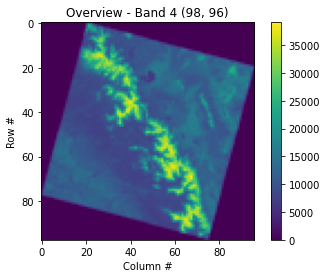

In [144]:
# The grid of raster values can be accessed as a numpy array and plotted:
with rasterio.open(filepath) as src:
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[-1] # let's look at the smallest thumbnail
    print('Decimation factor= {}'.format(oview))
    # NOTE this is using a 'decimated read' (http://rasterio.readthedocs.io/en/latest/topics/resampling.html)
    thumbnail = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))

print('array type: ',type(thumbnail))
print(thumbnail)

plt.imshow(thumbnail)
plt.colorbar()
plt.title('Overview - Band 4 {}'.format(thumbnail.shape))
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

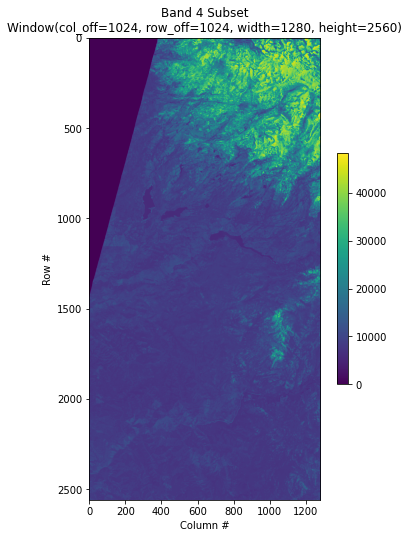

In [145]:
window = rasterio.windows.Window(1024, 1024, 1280, 2560)

with rasterio.open(filepath) as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(6,8.5))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

Decimation factor= 9


Text(0, 0.5, 'Row #')

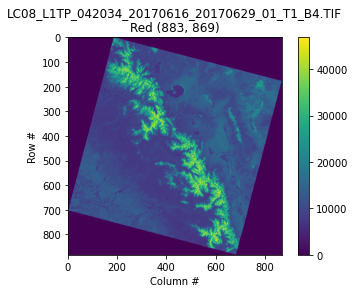

In [146]:
# Use the same example image:
date = '2017-06-16'
url = 'http://landsat-pds.s3.amazonaws.com/c1/L8/042/034/LC08_L1TP_042034_20170616_20170629_01_T1/'
redband = 'LC08_L1TP_042034_20170616_20170629_01_T1_B{}.TIF'.format(4)
nirband = 'LC08_L1TP_042034_20170616_20170629_01_T1_B{}.TIF'.format(5)

with rasterio.open(url+redband) as src:
    profile = src.profile
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[1]  # Use second-highest resolution overview
    print('Decimation factor= {}'.format(oview))
    red = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))

plt.imshow(red)
plt.colorbar()
plt.title('{}\nRed {}'.format(redband, red.shape))
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

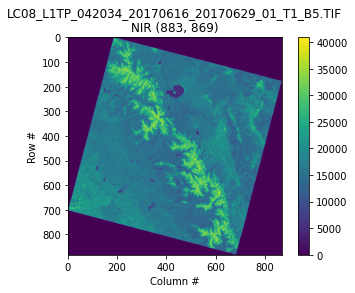

In [147]:
with rasterio.open(url+nirband) as src:
    oviews = src.overviews(1) # list of overviews from biggest to smallest
    oview = oviews[1]  # Use second-highest resolution overview
    nir = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))

plt.imshow(nir)
plt.colorbar()
plt.title('{}\nNIR {}'.format(nirband, nir.shape))
plt.xlabel('Column #')
plt.ylabel('Row #')

<ipython-input-148-20c0ccfacde0>:5: RuntimeWarning: invalid value encountered in true_divide
  ndvi = (nir - red) / (nir + red)


Text(0, 0.5, 'Row #')

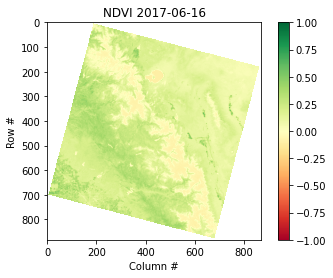

In [148]:
def calc_ndvi(nir,red):
    '''Calculate NDVI from integer arrays'''
    nir = nir.astype('f4')
    red = red.astype('f4')
    ndvi = (nir - red) / (nir + red)
    return ndvi

ndvi = calc_ndvi(nir,red)
plt.imshow(ndvi, cmap='RdYlGn')
plt.colorbar()
plt.title('NDVI {}'.format(date))
plt.xlabel('Column #')
plt.ylabel('Row #')